In [7]:
# Inference and visualization code
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch.autograd import Variable
import torch.nn as nn
import os
from datetime import datetime

In [8]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        
        # Increased initial size remains same to maintain 64x64 output
        self.init_size = 64 // 4  # Starting with 16x16
        
        # Increased latent dimension for more expressive generation
        self.latent_dim = 1024
        
        # Increased number of features in initial linear layer
        self.l1 = nn.Sequential(
            nn.Linear(self.latent_dim, 256 * self.init_size ** 2),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Enhanced convolution blocks with more features and additional refinement layers
        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(256),
            
            # First upsampling block (16x16 -> 32x32)
            nn.Upsample(scale_factor=2),
            nn.Conv2d(256, 256, 3, stride=1, padding=1),
            nn.BatchNorm2d(256, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            # Additional refinement layer
            nn.Conv2d(256, 256, 3, stride=1, padding=1),
            nn.BatchNorm2d(256, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Second upsampling block (32x32 -> 64x64)
            nn.Upsample(scale_factor=2),
            nn.Conv2d(256, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            # Additional refinement layer
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Final refinement and output layers
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 3, 3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, z):
        out = self.l1(z)
        out = out.view(out.shape[0], 256, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img

/tmp/ipykernel_5795/1532180087.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('model_big/checkpoint_epoch_200_20250121_200249.pth', map_locatio

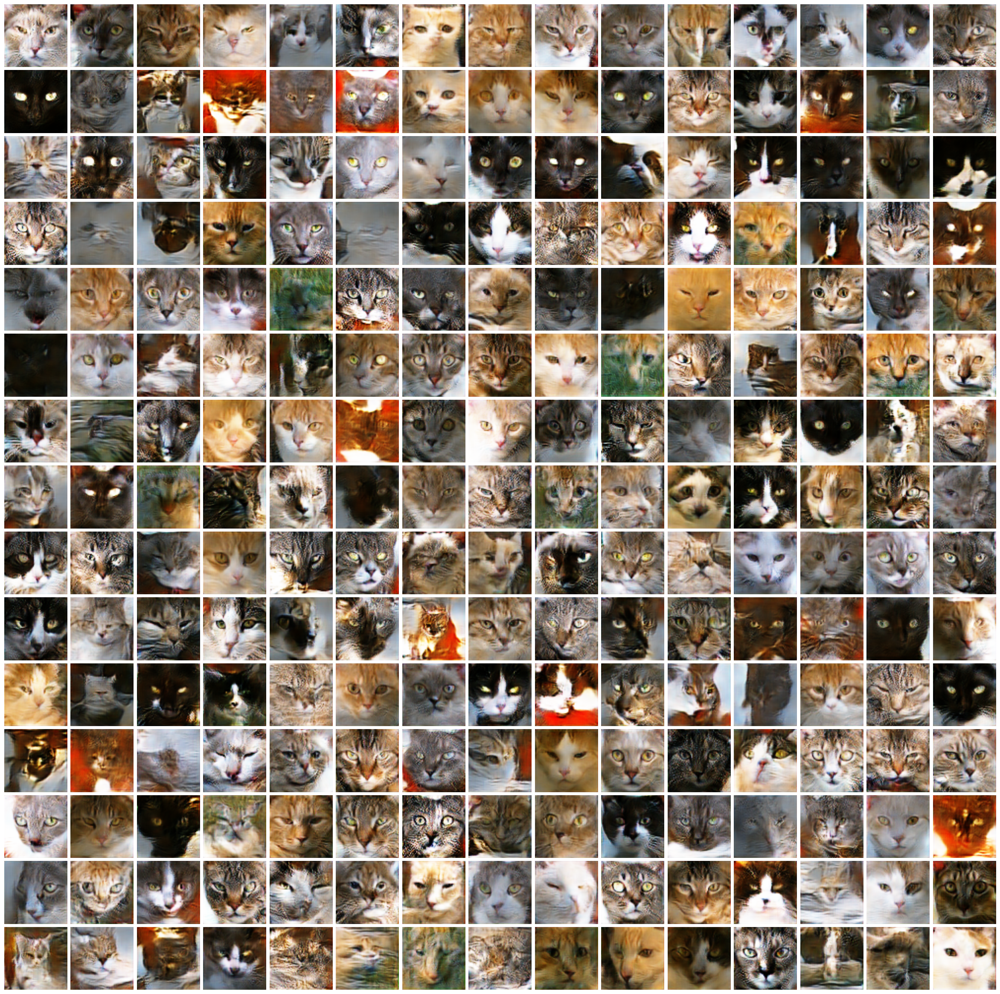

Saved image grid to: generated_images/grid_cat_20250121_203000.png


In [9]:
# Inference and visualization code with saving
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch.autograd import Variable
import os
from datetime import datetime

# Create output directory
os.makedirs("generated_images", exist_ok=True)

# Hyperparameters
latent_dim = 1024
img_size = 64
channels = 3

# Load generator
generator = Generator()
checkpoint = torch.load('model_big/checkpoint_epoch_200_20250121_200249.pth', map_location='cpu')
generator.load_state_dict(checkpoint['generator_state_dict'])
generator.eval()

# Generate images
n_images = 15 * 15  # 225 images for 15x15 grid
noise = Variable(torch.FloatTensor(np.random.normal(0, 1, (n_images, latent_dim))))

with torch.no_grad():
    generated_images = generator(noise)

# Denormalize and prepare for plotting
generated_images = generated_images * 0.5 + 0.5  # Scale from [-1,1] to [0,1]

# Create and save plot
fig, axes = plt.subplots(15, 15, figsize=(30, 30))
for i, ax in enumerate(axes.flat):
    img = generated_images[i].permute(1, 2, 0).numpy()
    ax.imshow(img)
    ax.axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)

plt.show()

# Generate timestamped filename
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
filename = f"generated_images/grid_cat_{timestamp}.png"

# Save high-quality image
plt.savefig(filename, bbox_inches='tight', pad_inches=0, dpi=300)
plt.close()

print(f"Saved image grid to: {filename}")